## configs

In [2]:
cleansed = '/Users/beantown/PycharmProjects/master-thesis/data/processed/03_post_cleansing'
path = '/Users/beantown/PycharmProjects/master-thesis/data/processed/'
# n = number of patches retrived from one papyry 
n = 20
# metric used to selecet patches
metric = 'preferText'
# size of the patch should be nxn and not nxm!
patch_size_width = 128
patch_size_height = 128

## Import dependencies 

In [3]:
import pandas as pd
from os.path import join, isfile
from skimage import io
from sklearn.feature_extraction.image import extract_patches_2d
import matplotlib.pyplot as plt

import torchvision.transforms

from skimage.metrics import structural_similarity
import numpy as np
import skimage
from skimage import measure
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import itertools
import plotly.express as px

In [13]:
def create_processed_info(path, debug=False):
    if debug:
        info_path = join(path, 'debug_processed_info.csv')
    else:
        info_path = join(path, 'processed_info.csv')
    if isfile(info_path):
        processed_frame = pd.read_csv(info_path, index_col=0,
                                      dtype={'fnames': str, 'papyID': int, 'posinfo': str, 'pixelCentimer': float},
                                      header=0)
    else:
        fnames = [f for f in listdir(path) if isfile(join(path, f))]
        fnames = [x for x in fnames if ".png" in x]
        fnames = [f.split('.', 1)[0] for f in fnames]
        fnames_frame = pd.DataFrame(fnames, columns=['fnames'])
        fragmentID = pd.DataFrame([f.split('_', 1)[0] for f in fnames], columns=['fragmentID'])
        fnames_raw = [f.split('_', 1)[1] for f in fnames]
        processed_frame = pd.DataFrame(fnames_raw, columns=['fnames_raw'])

        processed_frame = pd.concat([processed_frame, fnames_frame], axis=1)

        processed_frame = pd.concat([processed_frame, fragmentID], axis=1)
        processed_frame['papyID'] = processed_frame.fnames_raw.apply(lambda x: x.split('_', 1)[0])
        processed_frame['posinfo'] = processed_frame.fnames_raw.apply(lambda x: ''.join(filter(str.isalpha, x)))
        processed_frame['pixelCentimer'] = processed_frame.fnames_raw.progress_apply(retrive_size_by_fname)
        processed_frame.to_csv(info_path)

    return processed_frame

In [14]:
df = create_processed_info(cleansed)
print(f"Dataset len = {len(df)}")

Dataset len = 9970


## Example for one image

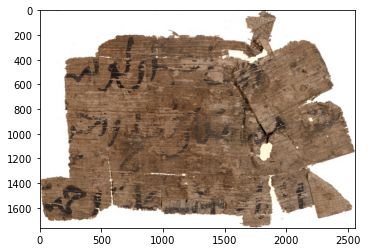

In [36]:
img = io.imread(cleansed + '/' + df.loc[1].fnames + '.png')
plt.imshow(img)
plt.show()

In [37]:
height = img.shape[0]
width = img.shape[1]
print(f"Img height = {height} and width = {width}")

Img height = 1763 and width = 2553


In [38]:
x = torch.tensor(np.array([img.T]))
x.shape
x[0][0][0]

tensor([255, 255, 255,  ..., 255, 255, 255], dtype=torch.uint8)

In [39]:
#x = torch.randn(1, 3, 220, 156)
kc, kh, kw = 3, 128, 128  # kernel size
dc, dh, dw = 3, 128, 128  # stride
# Pad to multiples of 32
x = F.pad(x, (x.size(2)%kw // 2, x.size(2)%kw // 2,
              x.size(1)%kh // 2, x.size(1)%kh // 2,
              x.size(0)%kc // 2, x.size(0)%kc // 2), mode='constant',value=255)

patches = x.unfold(1, kc, dc).unfold(2, kh, dh).unfold(3, kw, dw)
unfold_shape = patches.size()
patches = patches.contiguous().view(-1, kc, kh, kw)
print(patches.shape)

torch.Size([266, 3, 128, 128])


In [40]:
patches_orig = patches.view(unfold_shape)
output_c = unfold_shape[1] * unfold_shape[4]
output_h = unfold_shape[2] * unfold_shape[5]
output_w = unfold_shape[3] * unfold_shape[6]
patches_orig = patches_orig.permute(0, 1, 4, 2, 5, 3, 6).contiguous()
patches_orig = patches_orig.view(1, output_c, output_h, output_w)

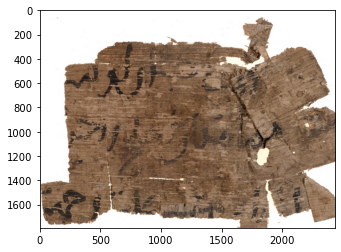

In [41]:
plt.imshow(patches_orig[0].numpy().T)
plt.show()

In [42]:
patches = patches.numpy()

In [43]:
patches.shape

(266, 3, 128, 128)

In [44]:


#image = np.arange(1, 10).reshape((3, 3))
labels = np.ones_like(img, dtype=int)

# arguments must be in the specified order, matching regionprops
def image_stdev(region, intensities):
    # note the ddof arg to get the sample var if you so desire!
    return np.std(intensities[region], ddof=1)
props = measure.regionprops(
    labels, img, extra_properties=[image_stdev]
)

org_var = props[0].image_stdev

In [45]:
similarities = []
list2 = []
for patch in patches:
    if np.mean(patch)>=np.mean(img):
        list2.append(patch)
        labels = np.ones_like(patch.T, dtype=int)
        variance = measure.regionprops(labels, patch.T, extra_properties=[image_stdev])[0].image_stdev
        similarities.append(variance)

In [46]:
list1 = np.array(similarities)
idx   = np.argsort(list1)
list1 = np.array(list1)[idx]
list2 = np.array(list2)[idx]

In [47]:
len(list1)

91

In [48]:
len(list2)

91

In [49]:
results = list2[list2.shape[0]-n:]

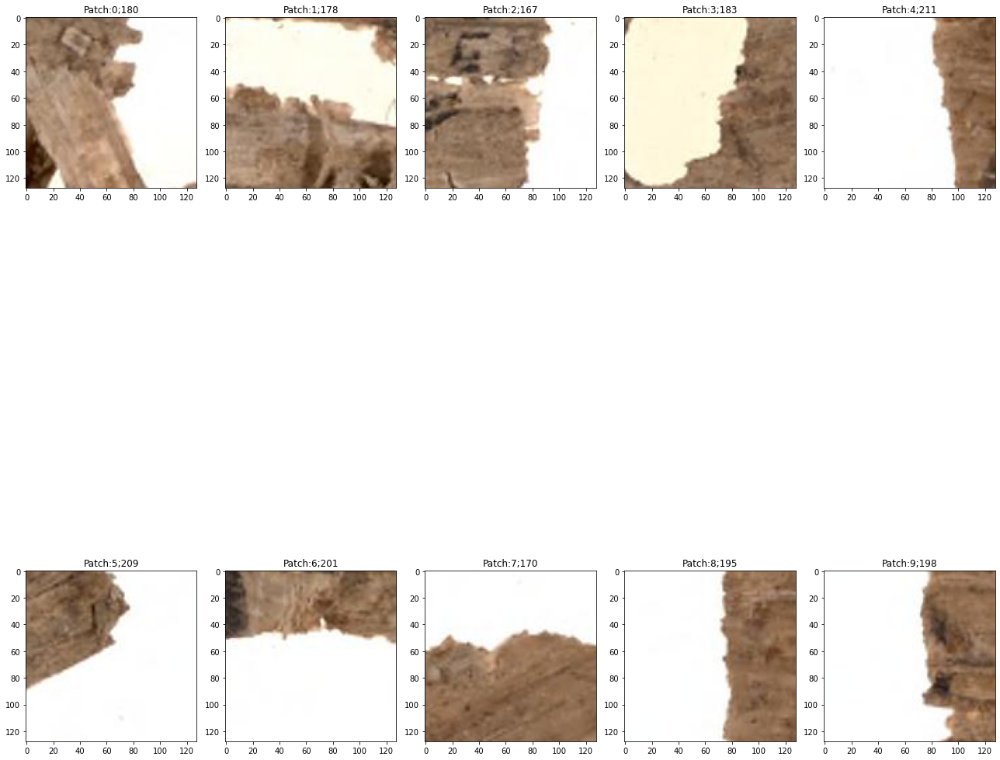

In [50]:
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(18, 26))
columns = 5
rows = 2


# ax enables access to manipulate each of subplots
ax = []

for i in range(columns*rows):
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    ax[-1].set_title("Patch:"+str(i)+  ';'+ str(round(np.mean(results[i].T))))  # set title
    plt.imshow(results[i].T)


plt.tight_layout()
plt.show()

## Execute for alles images

In [5]:
# arguments must be in the specified order, matching regionprops
def image_stdev(region, intensities):
    # note the ddof arg to get the sample var if you so desire!
    return np.std(intensities[region], ddof=1)

In [33]:
import torch.nn.functional as F

In [40]:
def check_patch(metric):
    """
    Wrapper function too check weather a patch fits to metric or not
    Args:
        metric:

    Returns:

    """

def create_dataset_1(df, n, m, name, path, decending, metric='variance'):
    new_df = pd.DataFrame(columns = ['image',
                                 'label',
                                 'original_image',
                                 'train',
                                 'test',
                                 'val',
                                 'position',
                                 'fragment',
                                'patch'
                                 'pixelcm'])

    for i in tqdm(range(len(df))):
        # get img from dataset
        img = io.imread(cleansed + '/' + df.loc[i].fnames + '.png')

        # use torch -> cast2 tensor
        x = torch.tensor(np.array([img.T]))

        # define patch size properties for padding and unfolding
        kc, kh, kw = 3, m, m  # kernel size
        dc, dh, dw = 3, m, m  # stride

    # Pad to multiples of m. If image is too small -> go to next image
        x = F.pad(x, (x.size(2)%kw // 2, x.size(2)%kw // 2,
                      x.size(1)%kh // 2, x.size(1)%kh // 2,
                      x.size(0)%kc // 2, x.size(0)%kc // 2), mode='constant',value=255)

        #create_patches
        patches = x.unfold(1, kc, dc).unfold(2, kh, dh).unfold(3, kw, dw)
        patches = patches.contiguous().view(-1, kc, kh, kw)


        
        #print(len(patches))
        org_img_labels = labels = np.ones_like(img, dtype=int)
 #      print(org_img_labels.shape)
#        print(img.shape)
        mean_img = measure.regionprops(org_img_labels, img)[0].intensity_mean                    

        # evaluate patch -> cast2 numpy
        patches = patches.numpy()
        selected_metric_values = []
        selected_patches = []
        selected_patch_ids = []
        
        if metric == 'variance':
            for patch_id, patch in enumerate(patches):
                #check if patch fits to metric

                if skimage.exposure.is_low_contrast(patch, fraction_threshold=0.025, lower_percentile=1, upper_percentile=99, method='linear') == False:
                    selected_patches.append(patch)
                    labels = np.ones_like(patch.T, dtype=int)                
                    variance = measure.regionprops(labels, patch.T, extra_properties=[image_stdev])[0].image_stdev
                    selected_metric_values.append(variance)
                    selected_patch_ids.append(patch_id)
        elif metric == 'mean':
            for patch_id, patch in enumerate(patches):
                if skimage.exposure.is_low_contrast(patch, fraction_threshold=0.025, lower_percentile=1, upper_percentile=99, method='linear') == False:
                    selected_patches.append(patch)
                    labels = np.ones_like(patch.T, dtype=int)                
                    intensity_mean = measure.regionprops(labels, patch.T)[0].intensity_mean                    
                    intensity_mean = abs(intensity_mean - mean_img)
                    selected_metric_values.append(intensity_mean)
                    selected_patch_ids.append(patch_id)
            
        

        # sort
        selected_metric_values = np.array(selected_metric_values)
        idx   = np.argsort(selected_metric_values)
        selected_patches = np.array(selected_patches)[idx]
        selected_patch_ids = np.array(selected_patch_ids)[idx]

        # get the first n patches which have the HIGHEST metric (e.g. variance)
        if decending:
            results = selected_patches[selected_patches.shape[0]-n:]
        else:
            results = selected_patches[:n]

        #print(len(selected_patches))
        
        for j, result in enumerate(results):
            # save the patch with the patch ID in front
            #print(result.shape)
            io.imsave(path + name + '/' + str(j) + '_'+ df.loc[i].fnames +  '.jpg', result.T)

            # append row too new dataframe with image, label, original_img
            new_df = new_df.append({'image' : str(j) + '_'+ df.loc[i].fnames +  '.jpg',
                            'label' : df.loc[i].papyID,
                            'original_image' : df.loc[i].fnames + '.png',
                            'train':True,
                            'test':False,
                            'val':False,
                            'position': df.loc[i].posinfo,
                            'fragment':df.loc[i].fragmentID,
                            'patch':j,
                            'pixelcm':df.loc[i].pixelCentimer
                            },ignore_index = True)

    new_df.to_csv(path + name + 'info.csv')

In [41]:
# uncoment when you want to recreate features for dataset 1. Make sure path is empty. 
create_dataset_1(df=df, n=5, m=64, name='07_dataset_4/', path=path, decending=False, metric='mean')

 16%|██████                               | 1639/9970 [22:52<55:57,  2.48it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_43106/1393979735.py:96: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/07_dataset_4//1_0_11302_4132AR.jpg is a low contrast image
  io.imsave(path + name + '/' + str(j) + '_'+ df.loc[i].fnames +  '.jpg', result.T)
/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_43106/1393979735.py:96: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/07_dataset_4//3_0_11302_4132AR.jpg is a low contrast image
  io.imsave(path + name + '/' + str(j) + '_'+ df.loc[i].fnames +  '.jpg', result.T)
/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_43106/1393979735.py:96: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/07_dataset_4//4_0_11302_4132AR.jpg is a low contrast image
  io.imsave(path + name + '/' + str(j) + '_'+ df.loc[i].fnames +  '.jpg', result.T)
 34%|███████████▊     

In [43]:
def create_train_val_test_frames(processed_frame):
    id_series = processed_frame.groupby('label')['image'].nunique().sort_values(ascending=False)
    id_frame = pd.DataFrame(id_series)
    base_line_papyris = id_frame[id_frame.image != 1].index
    df = processed_frame[processed_frame['label'].isin(base_line_papyris)]
    
    #get_cleand_papyri_hist(df, title = 'Histogram Fragments / Papyri  [removed papyris with just on fragment]', fig_name= 'HistogramFragAfter_2.pdf')
    
    id_series = df.groupby('label')['image'].nunique().sort_values(ascending=False)
    counts = np.bincount(id_series)

    def remove_empty_bins(counts):
        ticks = range(len(counts))
        new_ticks = []
        new_counts = []
        for tick, count in zip(ticks, counts):
            if count != 0:
                new_ticks.append(str(tick))
                new_counts.append(count)
        return new_ticks, new_counts

    frags_per_papyri, counts = remove_empty_bins(counts)
    
    train_ids = []
    val_ids = []
    test_ids = []

    for frag_per_papyri in frags_per_papyri:
        id_series = df.groupby('label')['image'].nunique().sort_values(ascending=False)
        ids = id_frame[id_frame.image == int(frag_per_papyri)].index
        if len(ids) <= 3:
            train_ids.append(ids[0])
        else:
            train, test = train_test_split(ids, test_size=0.1, random_state=44)
            train, val = train_test_split(train, test_size=0.11, random_state=44)
            train_ids = list(itertools.chain(train_ids, train))
            val_ids = list(itertools.chain(val_ids, val))
            test_ids = list(itertools.chain(test_ids, test))
            
    print(f'# of IDs in train = {len(train_ids)}')
    print(f'# of IDs in val = {len(val_ids)}')
    print(f'# of IDs in test = {len(test_ids)}')
    
    train_frame = df[df['label'].isin(train_ids)]
    val_frame = df[df['label'].isin(val_ids)]
    test_frame = df[df['label'].isin(test_ids)]
    
    print(f'# of IDs in train = {len(train_frame.label.unique())}')
    print(f'# of IDs in val = {len(val_frame.label.unique())}')
    print(f'# of IDs in test = {len(test_frame.label.unique())}')
    
    
    return train_frame, test_frame, val_frame

In [44]:
new_df = pd.read_csv(path + '07_dataset_4/' + 'info.csv')
train, test, val = create_train_val_test_frames(new_df)

# of IDs in train = 4823
# of IDs in val = 603
# of IDs in test = 609
# of IDs in train = 4823
# of IDs in val = 603
# of IDs in test = 609


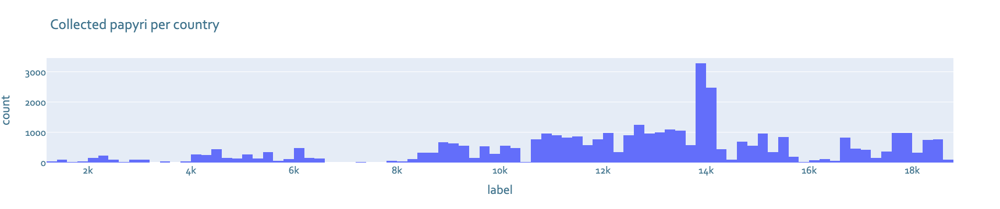

In [45]:
fig = px.histogram(train, x="label", title="Collected papyri per country")
fig.update_layout(
    autosize=True,
    font=dict(family="Corbel",size=18,color='rgb(65,116,141)'),
    #legend_title_font_color="green",
)

fig.show()

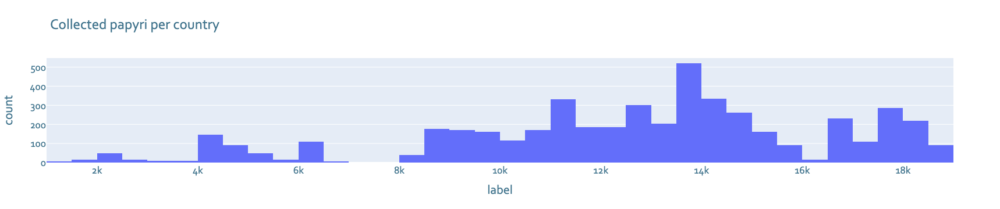

In [46]:
fig = px.histogram(val, x="label", title="Collected papyri per country")
fig.update_layout(
    autosize=True,
    font=dict(family="Corbel",size=18,color='rgb(65,116,141)'),
    #legend_title_font_color="green",
)

fig.show()

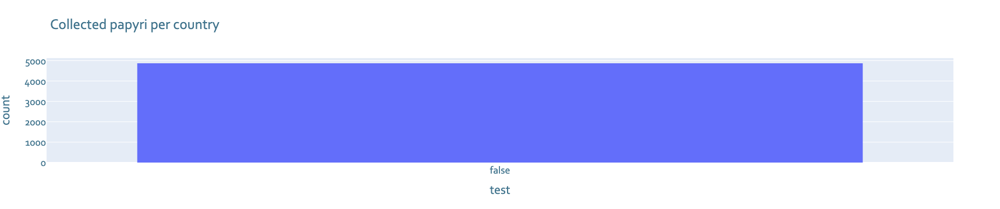

In [47]:
fig = px.histogram(val, x="test", title="Collected papyri per country")
fig.update_layout(
    autosize=True,
    font=dict(family="Corbel",size=18,color='rgb(65,116,141)'),
    #legend_title_font_color="green",
)

fig.show()

In [49]:
test.val = False
test.train = False
test.test = True
val.train = False
val.test = False
val.val = True
train.train = True
train.val = False
train.test = False
new_df = pd.concat([train,test,val])
#new_df.drop(columns=['Unnamed: 0','patchpixelcm'],inplace=True)
new_df.to_csv(path + '07_dataset_4/' + 'info.csv')
new_df = pd.read_csv(path + '07_dataset_4/' + 'info.csv')
new_df.drop(columns=['Unnamed: 0'], inplace=True)
new_df.drop(columns=['position','pixelcm'], inplace=True)
new_df.patch = new_df.patch.astype(int)
new_df.to_csv(path + '07_dataset_4/' + 'info.csv')

for i in tqdm(range(len(new_df))):
    img = io.imread(path + '07_dataset_4/' + new_df.loc[i].image)

    if new_df.loc[i].train == True:
        io.imsave(path + 'train/' + new_df.loc[i].image, img)

    elif new_df.loc[i].test == True:
        io.imsave(path + 'test/' + new_df.loc[i].image, img)
    else:
        io.imsave(path + 'val/' + new_df.loc[i].image, img)

 13%|████▌                              | 6287/48490 [00:11<01:11, 590.58it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_43106/1456384043.py:23: UserWarning:

/Users/beantown/PycharmProjects/master-thesis/data/processed/train/1_0_11302_4132AR.jpg is a low contrast image

/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_43106/1456384043.py:23: UserWarning:

/Users/beantown/PycharmProjects/master-thesis/data/processed/train/3_0_11302_4132AR.jpg is a low contrast image

/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_43106/1456384043.py:23: UserWarning:

/Users/beantown/PycharmProjects/master-thesis/data/processed/train/4_0_11302_4132AR.jpg is a low contrast image

 41%|█████████████▊                    | 19676/48490 [00:36<00:48, 591.75it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_43106/1456384043.py:23: UserWarning:

/Users/beantown/PycharmProjects/master-thesis/data/processed/train/2_0_13166_4462JV.jpg is a low contrast image

 49%

In [4]:
new_df = pd.read_csv(path + '07_dataset_4/data/' + 'info.csv' )

In [5]:
train = new_df[new_df.train == True]

In [9]:
len(train.label.unique())

4823

In [50]:
train_ids = train.groupby(['label']).count()['image'].sort_values(ascending=False)[:1000].index.tolist()
val = new_df[new_df.val == True]
val_ids = val.groupby(['label']).count()['image'].sort_values(ascending=False)[:1000].index.tolist()
test = new_df[new_df.test == True]
test_ids = test.groupby(['label']).count()['image'].sort_values(ascending=False)[:100].index.tolist()
ids = train_ids + val_ids + test_ids
final_df = new_df[new_df.label.isin(ids)]
len(final_df.label.value_counts())
final_df.to_csv(path  + 'info.csv')

In [51]:
final_df

,Unnamed: 0,Unnamed: 0.1,image,label,original_image,train,test,val,fragment,patchpixelcm,patch
5,5,5,0_0_10768_4098DV.jpg,10768,0_10768_4098DV.png,True,False,False,0,NaN,0
6,6,6,1_0_10768_4098DV.jpg,10768,0_10768_4098DV.png,True,False,False,0,NaN,1
7,7,7,2_0_10768_4098DV.jpg,10768,0_10768_4098DV.png,True,False,False,0,NaN,2
8,8,8,3_0_10768_4098DV.jpg,10768,0_10768_4098DV.png,True,False,False,0,NaN,3
9,9,9,4_0_10768_4098DV.jpg,10768,0_10768_4098DV.png,True,False,False,0,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...
48485,48485,49810,0_7_13899_4801DV.jpg,13899,7_13899_4801DV.png,False,False,True,7,NaN,0
48486,48486,49811,1_7_13899_4801DV.jpg,13899,7_13899_4801DV.png,False,False,True,7,NaN,1
48487,48487,49812,2_7_13899_4801DV.jpg,13899,7_13899_4801DV.png,False,False,True,7,NaN,2
48488,48488,49813,3_7_13899_4801DV.jpg,13899,7_13899_4801DV.png,False,False,True,7,NaN,3


In [52]:
train = final_df[final_df.train == True]
train = train[train.fragment < 5]
len(np.unique(train['original_image']))

3008

In [53]:
test = final_df[final_df.test == True]
test = test[test.fragment < 25]
len(np.unique(test['original_image']))

400

In [54]:
val = final_df[final_df.val == True]
val = val[val.fragment < 25]
len(np.unique(val['original_image']))

974

In [55]:
tet = df[df.test==True]
len(np.unique(test['original_image']))

400

In [60]:
df = pd.concat([train,test, val])

In [63]:
df = df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'])

In [70]:
df.to_csv(path  + 'info_d4.csv')

In [6]:
new_df.drop(columns=['Unnamed: 0'], inplace=True)

### Choose the first 50 classes - valid amount of samples

In [9]:
train = new_df[new_df.train == True]
train_ids = train.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
val = new_df[new_df.val == True]
val_ids = val.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
ids = train_ids + val_ids
final_df = new_df[new_df.label.isin(ids)]
len(final_df.label.value_counts())
final_df.to_csv(path  + 'info.csv')

## Create dataset II: Bigger patch size and bigger N

In [53]:
# uncoment when you want to recreate features for dataset 1. Make sure path is empty. 
#create_dataset_1(df=df, n=20, m=128, name='05_dataset_2/data/', path=path, decending=True)

  4%|██████▋                                                                                                                                                                                 | 362/9970 [04:02<2:31:16,  1.06it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_5764/1281458528.py:78: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/05_dataset_2/data//0_23_5518_583EV.jpg is a low contrast image
  io.imsave(path + name + '/' + str(j) + '_'+ df.loc[i].fnames +  '.jpg', result.T)
  4%|███████                                                                                                                                                                                 | 384/9970 [04:18<2:55:59,  1.10s/it]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_5764/1281458528.py:78: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/05_dataset_2/data//0_0_8470_1252_34R.jpg is a low contrast image
  io.imsave(path + name 

In [64]:
new_df = pd.read_csv(path + '05_dataset_2/data/' + 'info.csv')
train, test, val = create_train_val_test_frames(new_df)
test.train = False
test.test = True
val.train = False
val.test = False
val.val = True
new_df = pd.concat([train,test,val])
#new_df.drop(columns=['Unnamed: 0','patchpixelcm'],inplace=True)
new_df.to_csv(path + '05_dataset_2/data/' + 'info.csv')
new_df = pd.read_csv(path + '05_dataset_2/data/' + 'info.csv')
new_df

new_df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'], inplace=True, errors='ignore')
new_df.drop(columns=['position','pixelcm'], inplace=True, errors='ignore')
new_df.patch = new_df.patch.astype(int)
new_df.to_csv(path + '05_dataset_2/data/' + 'info.csv')

for i in tqdm(range(len(new_df))):
    img = io.imread(path + '05_dataset_2/data/' + new_df.loc[i].image)

    if new_df.loc[i].train == True:
        io.imsave(path + '05_dataset_2/train/' + new_df.loc[i].image, img)

    elif new_df.loc[i].test == True:
        io.imsave(path + '05_dataset_2/test/' + new_df.loc[i].image, img)
    else:
        io.imsave(path + '05_dataset_2/val/' + new_df.loc[i].image, img)

  3%|█████▍                                                                                                                                                                                | 5504/182214 [00:13<06:58, 422.64it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_5764/1719233181.py:10: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/05_dataset_2/train/0_23_5518_583EV.jpg is a low contrast image
  io.imsave(path + '05_dataset_2/train/' + new_df.loc[i].image, img)
  3%|█████▊                                                                                                                                                                                | 5816/182214 [00:13<06:39, 441.25it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_5764/1719233181.py:10: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/05_dataset_2/train/0_0_8470_1252_34R.jpg is a low contrast image
  io.imsave(path + '05_dataset_2/train/

In [66]:
train = new_df[new_df.train == True]
train_ids = train.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
val = new_df[new_df.val == True]
val_ids = val.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
ids = train_ids + val_ids
final_df = new_df[new_df.label.isin(ids)]
len(final_df.label.value_counts())
final_df.to_csv(path  + 'info.csv')

### Tests for Dataset II and Image Argumentation

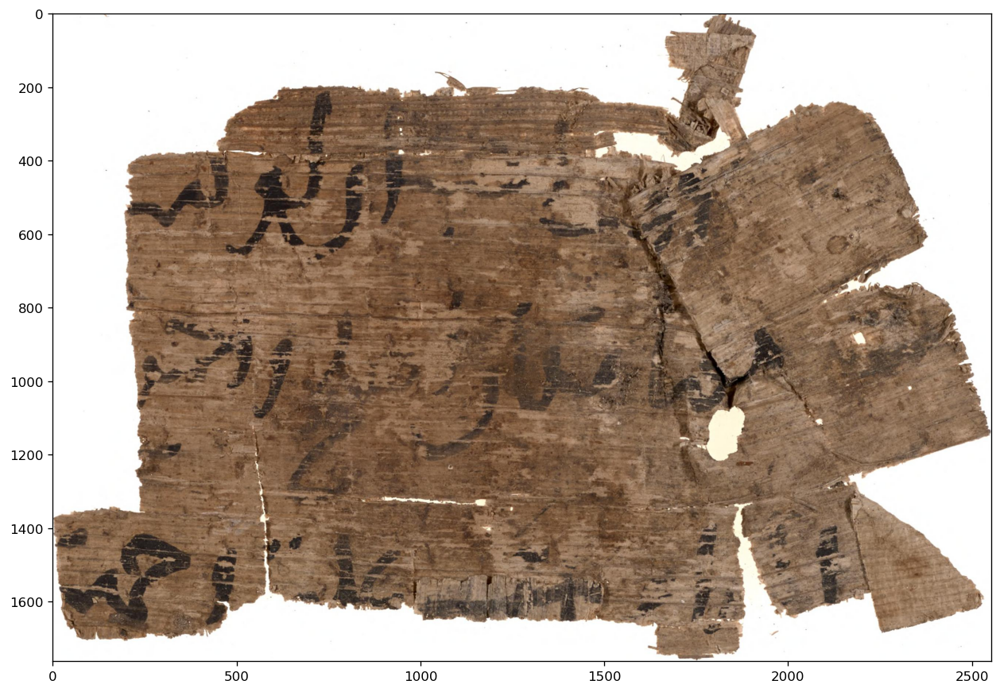

In [7]:
image = io.imread(cleansed + '/' + df.loc[1].fnames + '.png')
plt.figure(figsize=(21, 9), dpi=120)
plt.imshow(image)
plt.show()

In [54]:
org_img_labels = labels = np.ones_like(image, dtype=int)
 #       print(org_img_labels.shape)
#        print(img.shape)

ValueError: too many values to unpack (expected 2)

In [10]:
x = torch.tensor(np.array([image.T]))
x.shape

torch.Size([1, 3, 2553, 1763])

In [12]:
from torchvision import datasets, transforms

In [34]:
transformed_image = transforms.ColorJitter(brightness=0, contrast=0, hue=0, saturation=2)(x)

In [35]:
transformed_image.shape

torch.Size([1, 3, 2553, 1763])

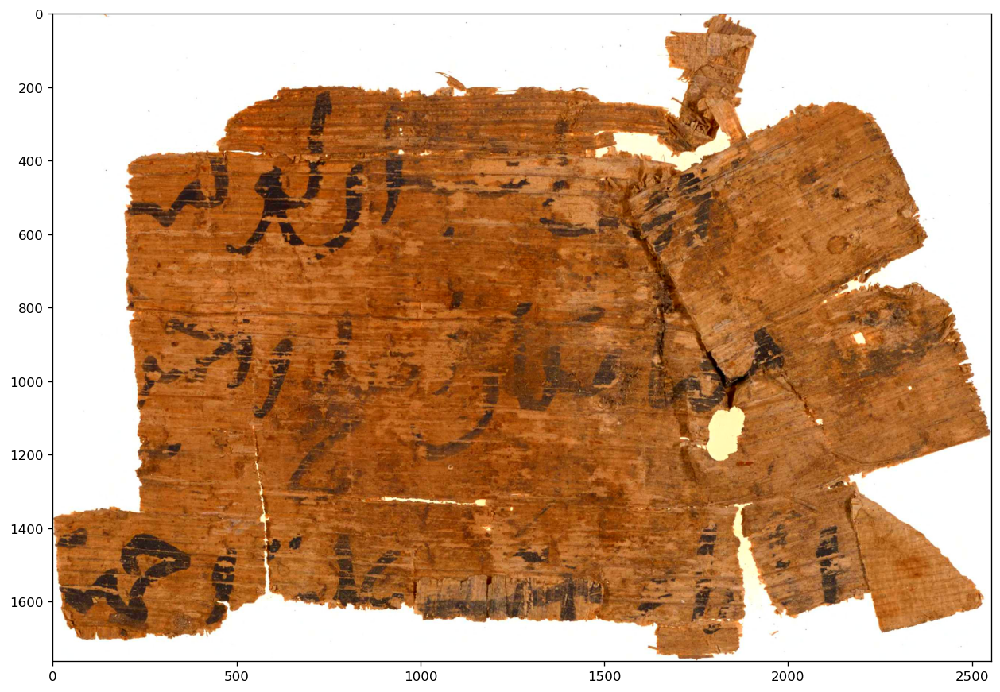

In [36]:
transformed_image = transformed_image.numpy()[0].T
plt.figure(figsize=(21, 9), dpi=120)
plt.imshow(transformed_image)
plt.show()

## Dataset III: Do the same thing but use images close too the mean instead of the variance

In [8]:
# uncoment when you want to recreate features for dataset 1. Make sure path is empty. 
#create_dataset_1(df=df, n=20, m=128, name='05_dataset_2/data/', path=path, decending=True)
create_dataset_1(df=df, n=20, m=128, name='06_dataset_3/data/', path=path, decending=False, metric='mean')

  0%|                                                                       | 10/9970 [00:07<1:49:34,  1.51it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_6597/4095822929.py:93: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/06_dataset_3/data//10_0_13960_4873DR.jpg is a low contrast image
  io.imsave(path + name + '/' + str(j) + '_'+ df.loc[i].fnames +  '.jpg', result.T)
  2%|█▎                                                                    | 183/9970 [02:07<2:00:20,  1.36it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_6597/4095822929.py:93: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/06_dataset_3/data//12_0_13521_4504HR.jpg is a low contrast image
  io.imsave(path + name + '/' + str(j) + '_'+ df.loc[i].fnames +  '.jpg', result.T)
  4%|██▍                                                                   | 349/9970 [04:39<2:57:50,  1.11s/it]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipyke

In [12]:
new_df = pd.read_csv(path + '06_dataset_3/data/' + 'info.csv')
train, test, val = create_train_val_test_frames(new_df)
test.train = False
test.test = True
val.train = False
val.test = False
val.val = True
new_df = pd.concat([train,test,val])
#new_df.drop(columns=['Unnamed: 0','patchpixelcm'],inplace=True)
new_df.to_csv(path + '06_dataset_3/data/' + 'info.csv')
new_df = pd.read_csv(path + '06_dataset_3/data/' + 'info.csv')
new_df

new_df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'], inplace=True, errors='ignore')
new_df.drop(columns=['position','pixelcm'], inplace=True, errors='ignore')
new_df.patch = new_df.patch.astype(int)
new_df.to_csv(path + '06_dataset_3/data/' + 'info.csv')

for i in tqdm(range(len(new_df))):
    img = io.imread(path + '06_dataset_3/data/' + new_df.loc[i].image)

    if new_df.loc[i].train == True:
        io.imsave(path + '06_dataset_3/train/' + new_df.loc[i].image, img)

    elif new_df.loc[i].test == True:
        io.imsave(path + '06_dataset_3/test/' + new_df.loc[i].image, img)
    else:
        io.imsave(path + '06_dataset_3/val/' + new_df.loc[i].image, img)


train = new_df[new_df.train == True]
train_ids = train.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
val = new_df[new_df.val == True]
val_ids = val.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
ids = train_ids + val_ids
final_df = new_df[new_df.label.isin(ids)]
len(final_df.label.value_counts())
final_df.to_csv(path  + 'info.csv')

# of IDs in train = 4804
# of IDs in val = 596
# of IDs in test = 603
# of IDs in train = 4804
# of IDs in val = 596
# of IDs in test = 603


  0%|                                                                     | 120/187289 [00:00<08:03, 387.22it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_6597/3081454400.py:23: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/06_dataset_3/train/10_0_13960_4873DR.jpg is a low contrast image
  io.imsave(path + '06_dataset_3/train/' + new_df.loc[i].image, img)
  2%|█                                                                   | 2900/187289 [00:07<07:21, 417.31it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_6597/3081454400.py:23: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/06_dataset_3/train/12_0_13521_4504HR.jpg is a low contrast image
  io.imsave(path + '06_dataset_3/train/' + new_df.loc[i].image, img)
  3%|██                                                                  | 5553/187289 [00:13<06:58, 434.29it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_6597/3081454400.py:23: Us

In [10]:
new_df = pd.read_csv(path + '06_dataset_3/data/' + 'info.csv')
train, test, val = create_train_val_test_frames(new_df)
test.train = False
test.test = True
val.train = False
val.test = False
val.val = True
test.train = False
test.val = False
test.test = True

new_df = pd.concat([train,test,val])
#new_df.drop(columns=['Unnamed: 0','patchpixelcm'],inplace=True)
new_df.to_csv(path + '06_dataset_3/data/' + 'info.csv')
new_df = pd.read_csv(path + '06_dataset_3/data/' + 'info.csv')
new_df

new_df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'], inplace=True, errors='ignore')
new_df.drop(columns=['position','pixelcm'], inplace=True, errors='ignore')
new_df.patch = new_df.patch.astype(int)
new_df.to_csv(path + '06_dataset_3/data/' + 'info.csv')

for i in tqdm(range(len(new_df))):
    img = io.imread(path + '06_dataset_3/data/' + new_df.loc[i].image)

    if new_df.loc[i].train == True:
        io.imsave(path + '06_dataset_3/train/' + new_df.loc[i].image, img)        
    elif new_df.loc[i].test == True:
        io.imsave(path + '06_dataset_3/test/' + new_df.loc[i].image, img)        
    else:
        io.imsave(path + '06_dataset_3/val/' + new_df.loc[i].image, img)
train = new_df[new_df.train == True]
train_ids = train.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
val = new_df[new_df.val == True]
val_ids = val.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
ids = train_ids + val_ids
final_df = new_df[new_df.label.isin(ids)]
len(final_df.label.value_counts())
final_df.to_csv(path  + 'info.csv')

# of IDs in train = 4804
# of IDs in val = 596
# of IDs in test = 603
# of IDs in train = 4804
# of IDs in val = 596
# of IDs in test = 603


  0%|                                                                      | 62/187289 [00:00<10:39, 292.58it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_13460/2236303431.py:27: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/06_dataset_3/train/10_0_13960_4873DR.jpg is a low contrast image
  io.imsave(path + '06_dataset_3/train/' + new_df.loc[i].image, img)
  1%|▊                                                                   | 2286/187289 [00:06<08:20, 369.36it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_13460/2236303431.py:27: UserWarning: /Users/beantown/PycharmProjects/master-thesis/data/processed/06_dataset_3/train/12_0_13521_4504HR.jpg is a low contrast image
  io.imsave(path + '06_dataset_3/train/' + new_df.loc[i].image, img)
  2%|█▌                                                                  | 4393/187289 [00:11<07:45, 392.83it/s]/var/folders/wj/vxbvyct136sdcvzl02f2nkph0000gn/T/ipykernel_13460/2236303431.py:27:

In [12]:
train = new_df[new_df.train == True]
train_ids = train.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
val = new_df[new_df.val == True]
val_ids = val.groupby(['label']).count()['image'].sort_values(ascending=False)[:50].index.tolist()
test = new_df[new_df.test == True]
test_ids = test.groupby(['label']).count()['image'].sort_values(ascending=False)[:100].index.tolist()
ids = train_ids + val_ids + test_ids
final_df = new_df[new_df.label.isin(ids)]
len(final_df.label.value_counts())
final_df.to_csv(path  + 'info.csv')

## Dataset IV: Do the same thing as in dataset II but use FFT and Highpass Filters on the images before

## Test of a single image

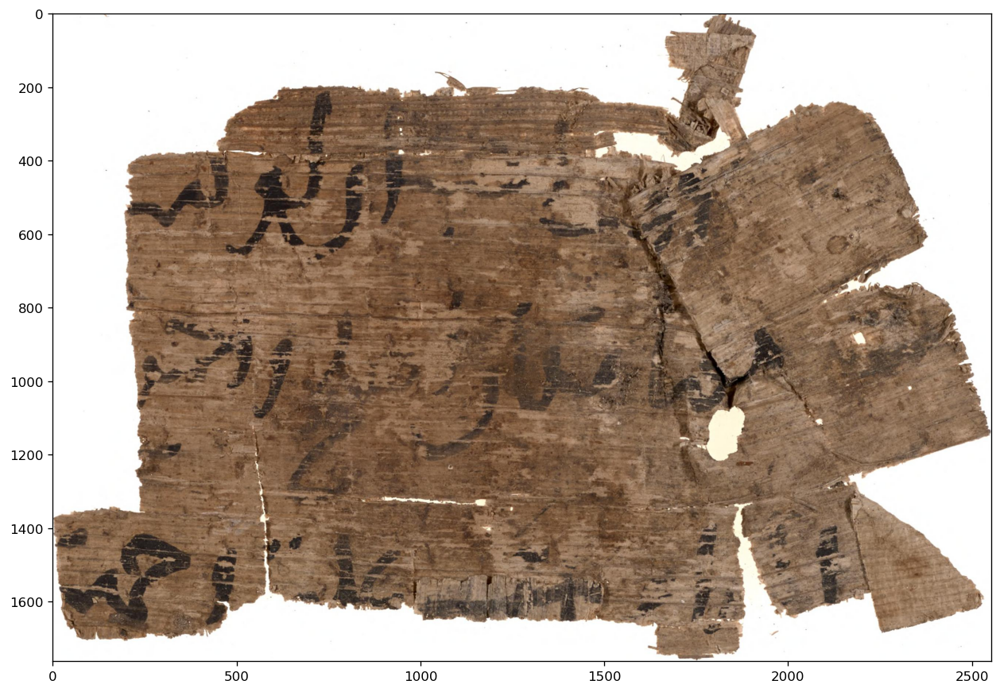

In [75]:
image = io.imread(cleansed + '/' + df.loc[1].fnames + '.png')
plt.figure(figsize=(21, 9), dpi=120)
plt.imshow(image)
plt.show()

In [78]:
from skimage.io import imread, imshow
from skimage.color import rgb2hsv, rgb2gray, rgb2yuv
from skimage import color, exposure, transform
from skimage.exposure import equalize_hist

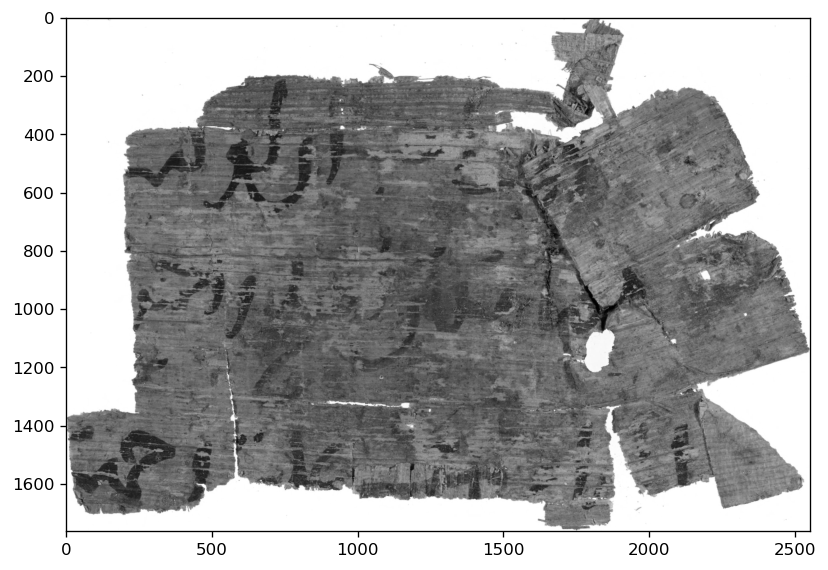

In [93]:
grey_image = rgb2gray(image)
plt.figure(num=None, figsize=(8, 6), dpi=120)
plt.imshow(dark_image_grey, cmap='gray');

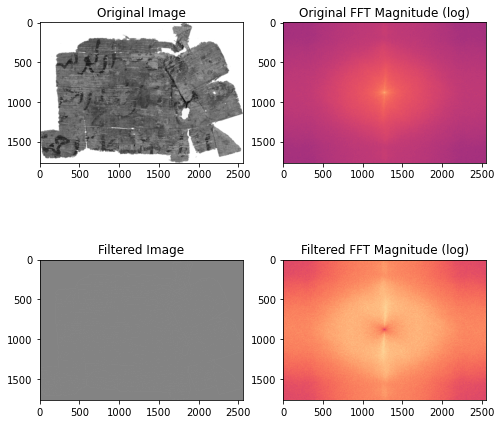

In [146]:
image = grey_image
wimage = image * window('hann', image.shape)  # window image to improve FFT
filtered_image = difference_of_gaussians(image, 0.5)
filtered_wimage = filtered_image * window('hann', image.shape)
im_f_mag = fftshift(np.abs(fftn(wimage)))
fim_f_mag = fftshift(np.abs(fftn(filtered_wimage)))

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
ax[0, 0].imshow(image, cmap='gray')
ax[0, 0].set_title('Original Image')
ax[0, 1].imshow(np.log(im_f_mag), cmap='magma')
ax[0, 1].set_title('Original FFT Magnitude (log)')
ax[1, 0].imshow(filtered_image, cmap='gray')
ax[1, 0].set_title('Filtered Image')
ax[1, 1].imshow(np.log(fim_f_mag), cmap='magma')
ax[1, 1].set_title('Filtered FFT Magnitude (log)')
plt.show()

In [141]:
masked_fourier = fourier.copy()
masked_fourier[:850, 1215:1315] = 1
masked_fourier[-860:,1215:1315] = 1

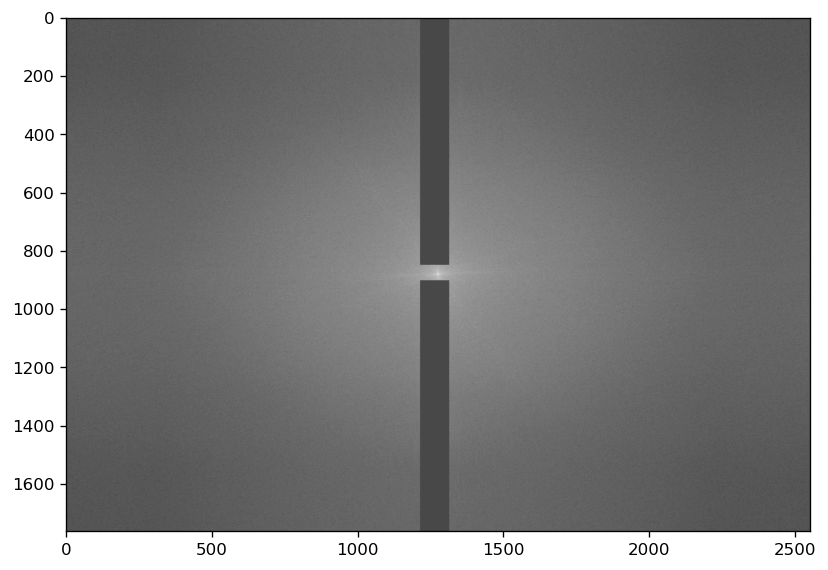

In [142]:
plt.figure(num=None, figsize=(8, 6), dpi=120)
plt.imshow(np.log(abs(masked_fourier)), cmap='gray');

In [143]:
filtered_image = abs(np.fft.ifft2(masked_fourier))

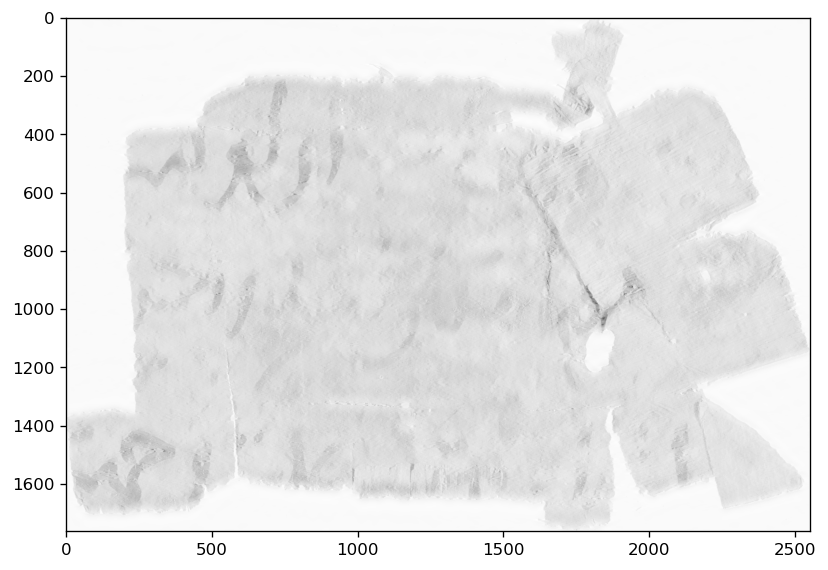

In [144]:
plt.figure(num=None, figsize=(8, 6), dpi=120)
plt.imshow(np.log(abs(filtered_image)), cmap='gray');

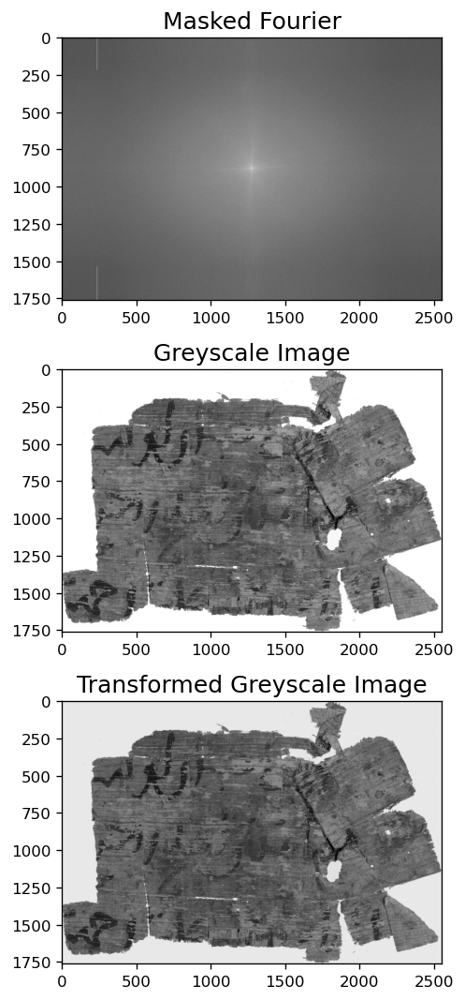

In [90]:
def fourier_masker(image, i):
    f_size = 15
    dark_image_grey_fourier = np.fft.fftshift(np.fft.fft2(rgb2gray(image)))
    
    dark_image_grey_fourier[:225, 235:240] = i
    
    dark_image_grey_fourier[-225:,235:240] = i
    
    fig, ax = plt.subplots(3,1,figsize=(21,9),dpi=120)
    ax[0].imshow(np.log(abs(dark_image_grey_fourier)), cmap='gray')
    ax[0].set_title('Masked Fourier', fontsize = f_size)
    ax[1].imshow(rgb2gray(image), cmap = 'gray')
    ax[1].set_title('Greyscale Image', fontsize = f_size);
    ax[2].imshow(abs(np.fft.ifft2(dark_image_grey_fourier)), 
                     cmap='gray')
    ax[2].set_title('Transformed Greyscale Image', 
                     fontsize = f_size);
    plt.tight_layout()
    plt.show()
fourier_masker(image, 200)